# 00 MAIN QC

## Notebook setup

In [1]:
import warnings
warnings.filterwarnings('ignore')

import scanpy as sc
import scanpy.external as sce
import numpy as np
import pandas as pd
import warnings, scipy.sparse as sp, matplotlib, matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.pyplot import rc_context
from collections import Counter
import matplotlib.font_manager
import openpyxl
import pyreadr
import rpy2
from rpy2.robjects.packages import importr
import rpy2.robjects as robjects
#import magic
#import seaborn as sns
import palantir
import loompy
import feather
import re
#from scipy.sparse import csgraph

matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
matplotlib.rcParams['font.family'] = 'sans-serif'
matplotlib.rcParams['font.sans-serif'] = 'Arial'
matplotlib.rc('font', size=14)
import matplotlib.lines as lines

pd.set_option('display.max_rows', 200)

sc.set_figure_params(dpi=80, dpi_save=300, color_map='Spectral_r', vector_friendly=True, transparent=True)
sc.settings.verbosity = 0 # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()

findfont: Font family ['Raleway'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Lato'] not found. Falling back to DejaVu Sans.


scanpy==1.9.1 anndata==0.8.0 umap==0.5.3 numpy==1.20.2 scipy==1.5.3 pandas==1.4.4 scikit-learn==1.1.2 statsmodels==0.13.2 python-igraph==0.9.11 pynndescent==0.5.7


In [2]:
# preset color palettes and color maps
user_defined_palette =  [ '#F6222E', '#16FF32', '#3283FE', '#FEAF16', '#BDCDFF', '#3B00FB', '#1CFFCE', '#C075A6', '#F8A19F', '#B5EFB5', '#FBE426', '#C4451C', 
                          '#2ED9FF', '#c1c119', '#8b0000', '#FE00FA', '#1CBE4F', '#1C8356', '#0e452b', '#AA0DFE', '#B5EFB5', '#325A9B', '#90AD1C']

user_defined_cmap_markers = LinearSegmentedColormap.from_list('mycmap', ["#E6E6FF", "#CCCCFF", "#B2B2FF", "#9999FF",  "#6666FF",   "#3333FF", "#0000FF"])
user_defined_cmap_degs = LinearSegmentedColormap.from_list('mycmap', ["#0000FF", "#3333FF", "#6666FF", "#9999FF", "#B2B2FF", "#CCCCFF", "#E6E6FF", "#E6FFE6", "#CCFFCC", "#B2FFB2", "#99FF99", "#66FF66", "#33FF33", "#00FF00"])

In [3]:
%matplotlib inline 

## Load cellranger output files

In [4]:
from pathlib import Path

adatas_list=[]
names_list=[]

tenexdir = '../data/internal/10xGenomics/Chromium/'
h5_path = Path(tenexdir).glob('**/**/**/**/filtered_feature_bc_matrix.h5')

for path in h5_path:
    tmp_adata = sc.read_10x_h5(path)
    tmp_adata.var_names_make_unique()
    tmp_adata.shape # check the number of cells and genes in sample 1
    adatas_list.append(tmp_adata)

In [5]:
adata = sc.concat(
    adatas_list, # add more annadata objects here separated by commas
    join='outer', 
    label = 'sample', 
    keys = ['mo02_CD45neg1_d4', 'mo02_CD45neg1_d0', 'mo02_CD45neg2_d7', 'mo02_FB_d1',
            'mo02_CD45neg2_d1', 'mo02_EC_d7', 'mo02_EC_d4', 'mo02_FB_d7', 
            'mo02_EC_d1', 'mo02_EC_d0', 'mo02_FB_d4', 'mo02_CD45neg2_d4',  
            'mo02_CD45neg2_d0', 'mo02_CD45neg1_d7', 'mo02_CD45neg1_d1','mo02_FB_d0',
            'mo18_EC_d1', 'mo18_FB_d1', 'mo18_CD45neg_d4', 'mo18_CD45neg1_d0',
            'mo18_EC_d4', 'mo18_FB_d4', 'mo18_CD45neg2_d0', 'mo18_CD45neg_d7',
            'mo18_CD45neg_d1', 'mo18_EC_d7', 'mo18_EC_d0', 'mo18_FB_d7', 'mo18_FB_d0' 
           ], # or use your sample_names list (as used above) here. 
    # Make sure the order of the batch categories matches that of the AnnData objects 
    index_unique = '@'
)

In [6]:
adata.raw = adata # keep a copy of the raw adata 
np.random.seed(42) 
index_list = np.arange(adata.shape[0]) # randomize the order of cells for plotting
np.random.shuffle(index_list)
adata = adata[index_list]

In [7]:
adata.shape

(93738, 32285)

In [8]:
# metadata
adata.obs['stage'] = ['02mo' if 'mo02' in x else '18mo' if 'mo18' in x else 'error' for x in adata.obs['sample'] ]
adata.obs['day'] = ['d0' if 'd0' in x else 'd1' if 'd1' in x else 'd4' if 'd4' in x else 'd7' if 'd7' in x else 'error' for x in adata.obs['sample'] ]

In [9]:
adata.uns['stage_colors'] =  ['#76D6FF','#FF8072'] # ['#F5B4AE', '#8FD6D9']
adata.uns['day_colors'] = ['#0080FF', '#FFA500',  '#FF00FF', '#00D6D8']

## Save raw count means for correlation with the bulk RNA-seq data

In [ ]:
def grouped_obs_mean(adata, group_key, layer=None, gene_symbols=None):
    if layer is not None:
        getX = lambda x: x.layers[layer]
    else:
        getX = lambda x: x.X
    if gene_symbols is not None:
        new_idx = adata.var[idx]
    else:
        new_idx = adata.var_names

    grouped = adata.obs.groupby(group_key)
    out = pd.DataFrame(
        np.zeros((adata.shape[1], len(grouped)), dtype=np.float64),
        columns=list(grouped.groups.keys()),
        index=adata.var_names
    )

    for group, idx in grouped.indices.items():
        X = getX(adata[idx])
        out[group] = np.ravel(X.mean(axis=0, dtype=np.float64))
    return out

In [ ]:
for_bulk = adata[(adata.obs['sample']=='mo02_CD45neg1_d0') | (adata.obs['sample']=='mo02_CD45neg2_d0') |
                 (adata.obs['sample']=='mo02_CD45neg1_d1') | (adata.obs['sample']=='mo02_CD45neg2_d1') |
                 (adata.obs['sample']=='mo02_CD45neg1_d4') | (adata.obs['sample']=='mo02_CD45neg2_d4') |
                 (adata.obs['sample']=='mo02_CD45neg1_d7') | (adata.obs['sample']=='mo02_CD45neg2_d7')]

grouped_obs_mean(for_bulk, group_key='day').to_excel('forbulk_meanbyday.xlsx', sheet_name='Sheet1')

In [ ]:
tt = pd.DataFrame(np.array(pd.DataFrame.sparse.from_spmatrix(for_bulk.X).fillna(0)), columns=for_bulk.var.index, index=for_bulk.obs.index)

In [ ]:
tt.mean()

## Calculate quality control metrics and perform standard data clean-up

In [10]:
sc.pp.calculate_qc_metrics(adata, inplace=True)
#store all unfiltered/unprocessed data prior to downstream analysis
adata.obs['original_total_counts'] = adata.obs['total_counts']
adata.obs['log10_original_total_counts'] = np.log10(adata.obs['original_total_counts'])

In [11]:
# mitochondrial genes
adata.var['mt'] = adata.var_names.str.startswith(('MT-', 'mt-')) 
# ribosomal genes
adata.var['ribo'] = adata.var_names.str.startswith(('RPS','RPL', 'Rps', 'Rpl'))
# hemoglobin genes.
adata.var['hb'] = adata.var_names.str.startswith(('^Hb', '^HB'))

# for each cell compute fraction of counts in mitochondrial genes and ribosomal genes vs. all genes 
adata.obs['mito_frac'] = np.sum(adata[:,adata.var['mt']==True].X, axis=1) / np.sum(adata.X, axis=1)
adata.obs['ribo_frac'] = np.sum(adata[:,adata.var['ribo']==True].X, axis=1) / np.sum(adata.X, axis=1)
adata.obs['hb_frac'] = np.sum(adata[:,adata.var['hb']==True].X, axis=1) / np.sum(adata.X, axis=1)

### Identify doublet cells

In [12]:
sc.external.pp.scrublet(adata, threshold=0.25, random_state=42) # choose threshold manually

Detected doublet rate = 1.0%
Estimated detectable doublet fraction = 37.6%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 2.6%


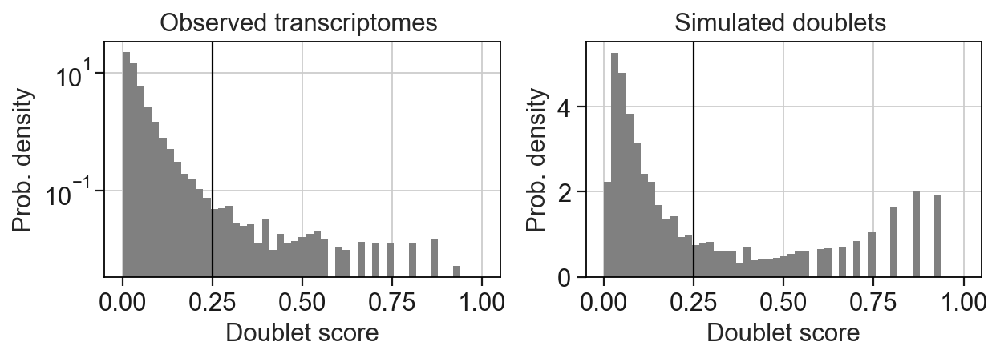

In [13]:
# check manual threshold
sc.external.pl.scrublet_score_distribution(adata)

### Remove not expressed genes

In [14]:
# remove genes that are not expressed in any cells (remove columns with all 0s)
sc.pp.filter_genes(adata, min_cells=1)

### Remove ribosomal protein genes

In [15]:
adata = adata[:,adata.var['ribo']==False]
adata.shape
adata = adata[:,adata.var['hb']==False]
adata.shape

(93738, 28951)

### Normalize for each cell's library size

In [16]:
sc.pp.normalize_per_cell(adata, counts_per_cell_after=10**4)

### Log-transform counts

In [17]:
sc.pp.log1p(adata)

## Select subset of principal components 

In [18]:
rng = np.random.RandomState(42)
sc.tl.pca(adata, n_comps=200, svd_solver='arpack', random_state=rng, use_highly_variable=False)

<function matplotlib.pyplot.show(close=None, block=None)>

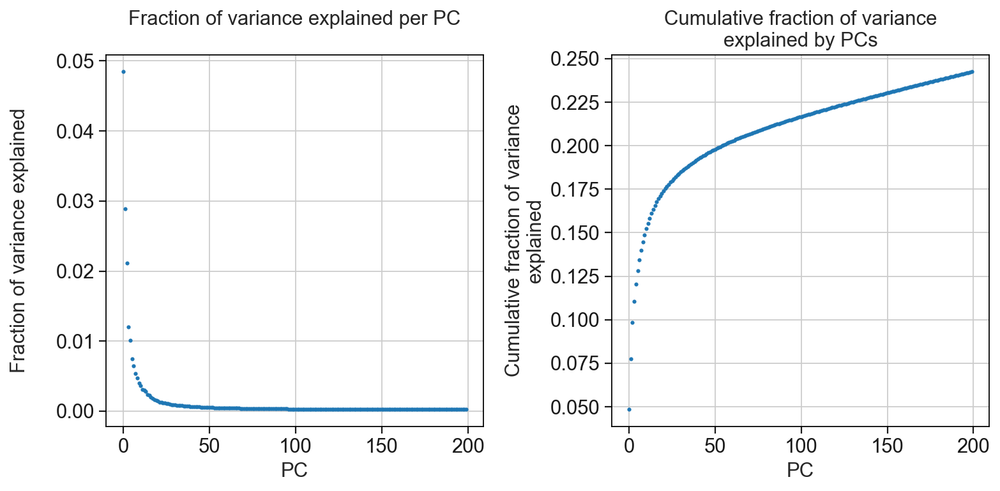

In [19]:
def observe_variance(anndata_object):
    fig = plt.figure(figsize=(10,5))
    ax1 = fig.add_subplot(121)
    ax2 = fig.add_subplot(122)
    # variance per principal component
    x = range(len(anndata_object.uns['pca']['variance_ratio']))
    y = anndata_object.uns['pca']['variance_ratio']
    ax1.scatter(x,y,s=4)
    ax1.set_xlabel('PC')
    ax1.set_ylabel('Fraction of variance explained\n')
    ax1.set_title('Fraction of variance explained per PC\n')
    # cumulative variance explained
    cml_var_explained = np.cumsum(anndata_object.uns['pca']['variance_ratio'])
    x = range(len(anndata_object.uns['pca']['variance_ratio']))
    y = cml_var_explained
    ax2.scatter(x,y,s=4)
    ax2.set_xlabel('PC')
    ax2.set_ylabel('Cumulative fraction of variance\nexplained')
    ax2.set_title('Cumulative fraction of variance\nexplained by PCs')
    fig.tight_layout()
    plot = plt.show
    return(plot)
observe_variance(adata)

In [20]:
rng = np.random.RandomState(42)
sc.tl.pca(adata, n_comps=65,  svd_solver='arpack', random_state=rng, use_highly_variable=False)

In [21]:
sc.pp.neighbors(adata, n_neighbors=15, random_state=42)

In [22]:
sc.tl.umap(adata)

### Sample metadata

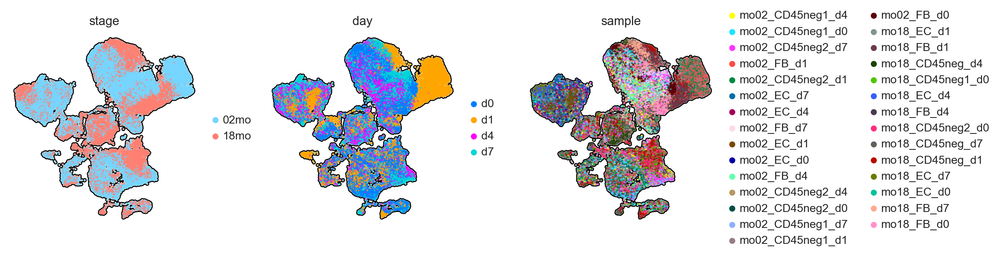

In [23]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)
sc.pl.umap(
    adata, 
    color=['stage', 'day', 'sample'], 
    color_map='Spectral_r', 
    use_raw=False,
    ncols=15,
    wspace = 0.2,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

### QC metrics

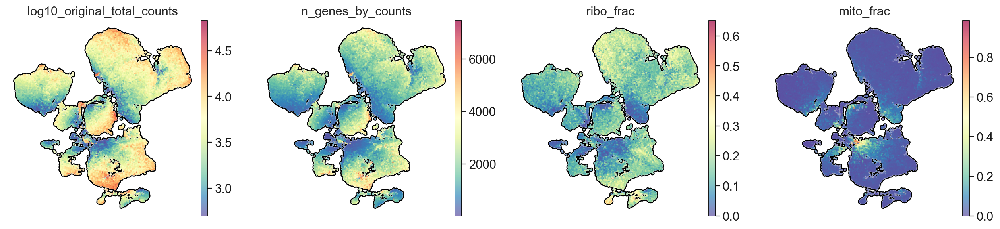

In [24]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)
sc.pl.umap(
    adata, 
    color=['log10_original_total_counts', 'n_genes_by_counts','ribo_frac', 'mito_frac'], 
    palette=user_defined_palette,  
    color_map='Spectral_r',
    use_raw=False,
    ncols=5,
    wspace = 0.2,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

### Potential contaminant populations

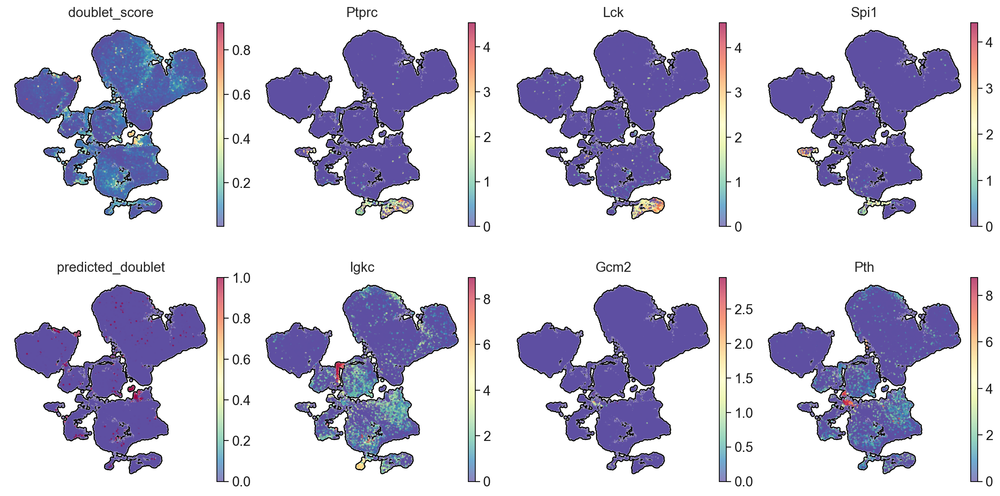

In [25]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)
sc.pl.umap(
    adata, 
    color=[ 'doublet_score', 'Ptprc', 'Lck', 'Spi1', 'predicted_doublet', 'Igkc', 'Gcm2', 'Pth'], 
    palette=user_defined_palette,  
    color_map='Spectral_r',
    use_raw=False,
    ncols=4,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [26]:
adata_total = adata

## Run unsupervised clustering analysis leiden

In [27]:
for resolution_parameter in [0.2, 0.4, 0.6, 0.8, 1.0, 1.2, 1.4, 1.6, 1.8, 2.0]:
    sc.tl.leiden(adata, resolution=resolution_parameter, random_state=42, 
                        key_added='leiden_'+str(resolution_parameter))

We can visualize the clustering to see which clusters match with the cells that we would like to filter out. Inspect the list of QC metrics and canonical markers to make your choice.

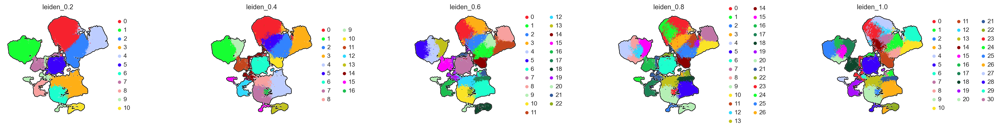

In [28]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)
sc.pl.umap(
    adata, 
    color=['leiden_0.2', 'leiden_0.4', 'leiden_0.6', 'leiden_0.8', 'leiden_1.0'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.7,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

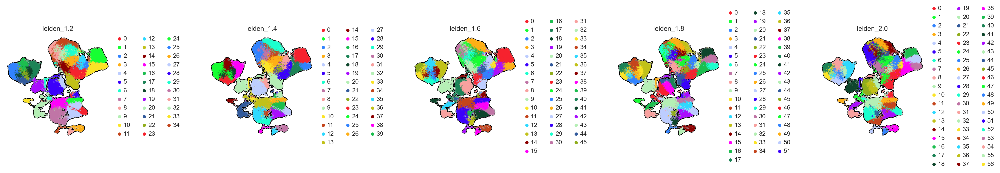

In [29]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)
sc.pl.umap(
    adata, 
    color=['leiden_1.2',  'leiden_1.4', 'leiden_1.6', 'leiden_1.8', 'leiden_2.0'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    size=15,
    wspace = 0.7,
    outline_width=[0.6, 0.05],
    frameon=False,
    add_outline=True,
    sort_order = False
)

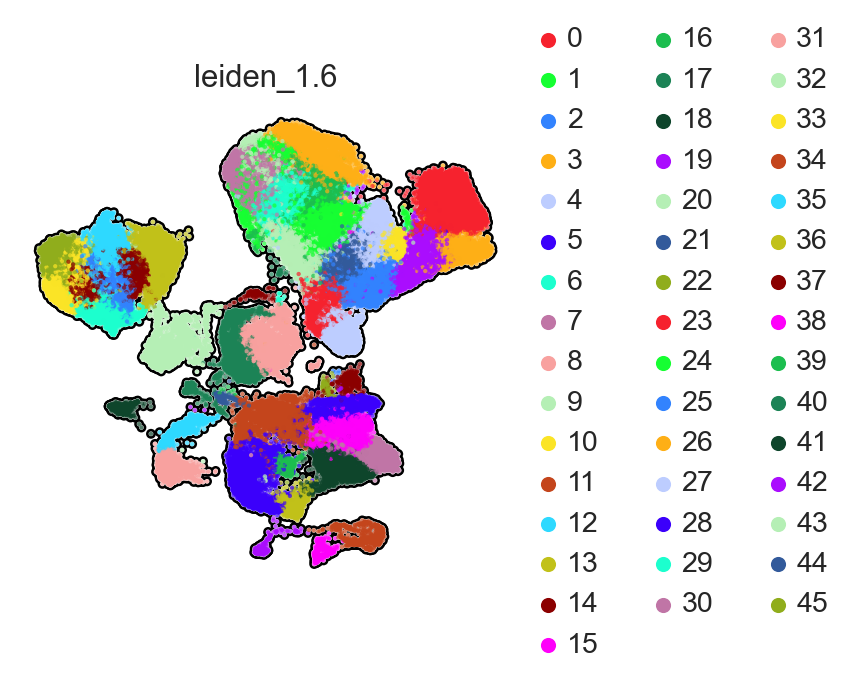

In [30]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)
sc.pl.umap(
    adata, 
    color=['leiden_1.6'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    size=15,
    wspace = 0.7,
    outline_width=[0.6, 0.05],
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [31]:
path_to_h5ad = '../output/anndata_io/FigS1.h5ad'

In [32]:
adata.write(path_to_h5ad)

## Filter out bad quality cells by cluster

In [33]:
clusters_to_remove = ['11', '23', '27', '29', '34', '35', '38', '40', '41', '42', '43', '44']
cluster_filter = [x not in clusters_to_remove for x in adata.obs['leiden_1.6']]
print('Total number of cells pre-filtering: ' + str(adata.shape[0]))
print('Number of cells to keep after filtering: ' + str(sum(cluster_filter)))
adata_filtered = adata[cluster_filter]

Total number of cells pre-filtering: 93738
Number of cells to keep after filtering: 82092


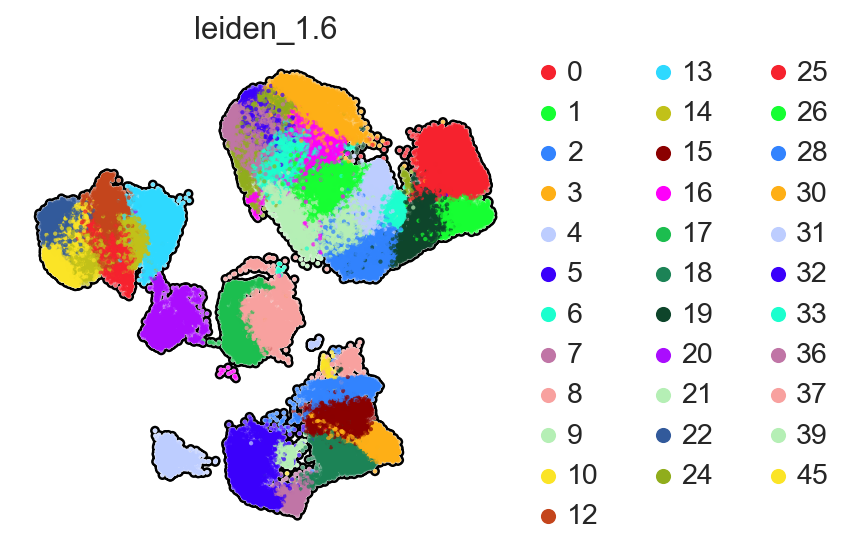

In [34]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)
sc.pl.umap(
    adata_filtered, 
    color=['leiden_1.6'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.5,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [35]:
adata = adata_filtered

In [36]:
adata.shape

(82092, 28951)

## Filter out doublets and cell contaminants

In [37]:
adata = adata[adata.obs['predicted_doublet'] == False]

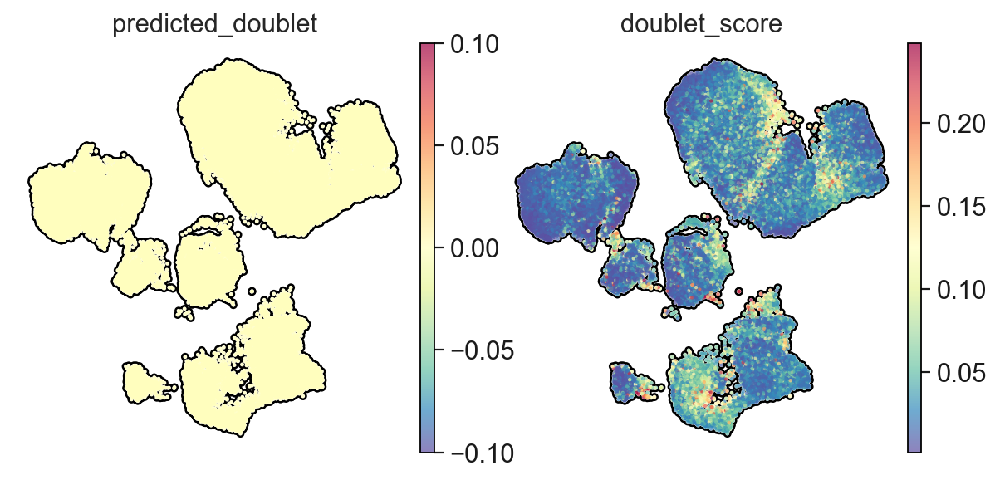

In [38]:
sc.pl.umap(
    adata, 
    color=['predicted_doublet', 'doublet_score'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [39]:
adata.obs['keep_cell'] = '0.yes'

In [40]:
keep_cells = pd.concat([adata.obs['keep_cell']])

In [41]:
adata_total.obs['keep_cell'] = '1.no'

In [42]:
adata_total.obs['keep_cell'][adata_total.obs.index.isin(keep_cells.index) == True] = '0.yes'

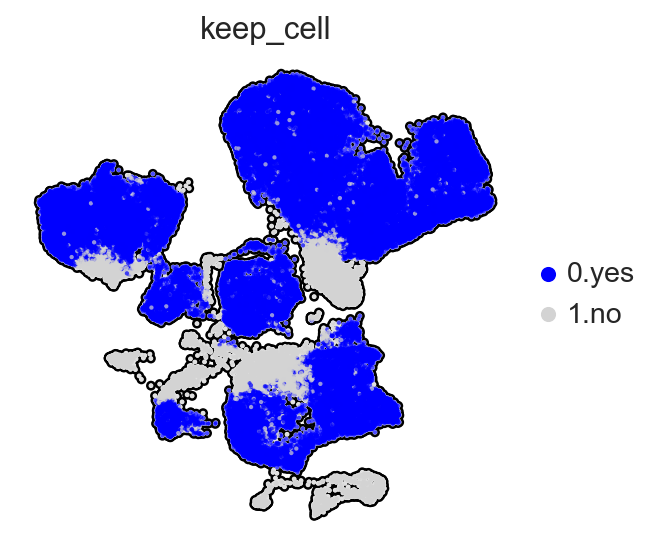

In [43]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    adata_total, 
    color=['keep_cell'], 
    palette=['blue', '#d3d3d3'],  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [44]:
crosstb = pd.crosstab(adata_total.obs['sample'], adata_total.obs['keep_cell'])

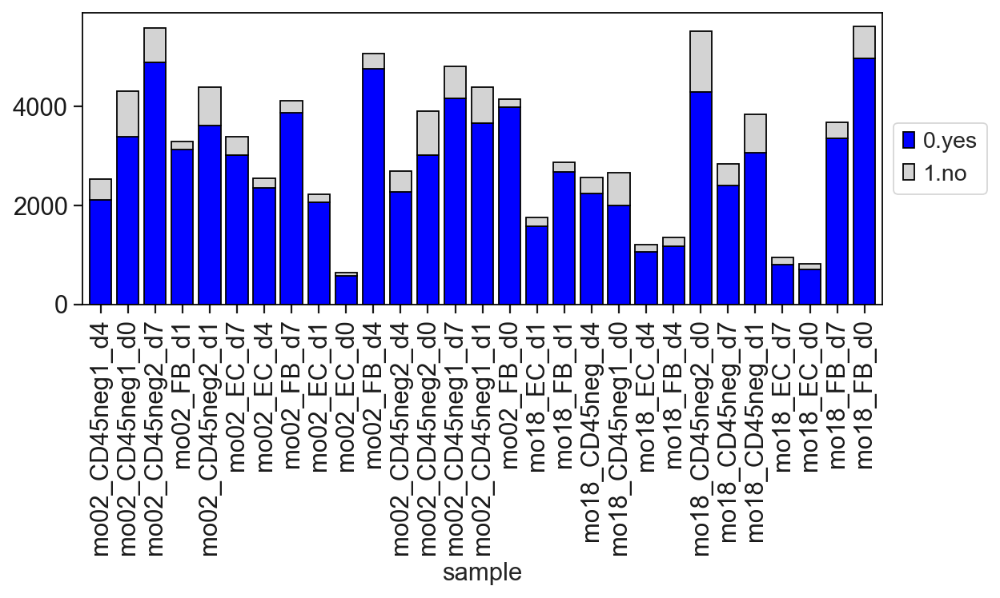

In [45]:
with rc_context({'figure.figsize': (8, 3)}):
    ax = crosstb.plot(kind="bar", stacked=True, edgecolor = "black", width=0.8,  color=['blue', '#d3d3d3'])
    ax.grid(False) 
    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))

## Reanalyze data after removal of cells

In [46]:
rng = np.random.RandomState(42)
sc.tl.pca(adata, n_comps=200, svd_solver='arpack', random_state=rng, use_highly_variable=False)

<function matplotlib.pyplot.show(close=None, block=None)>

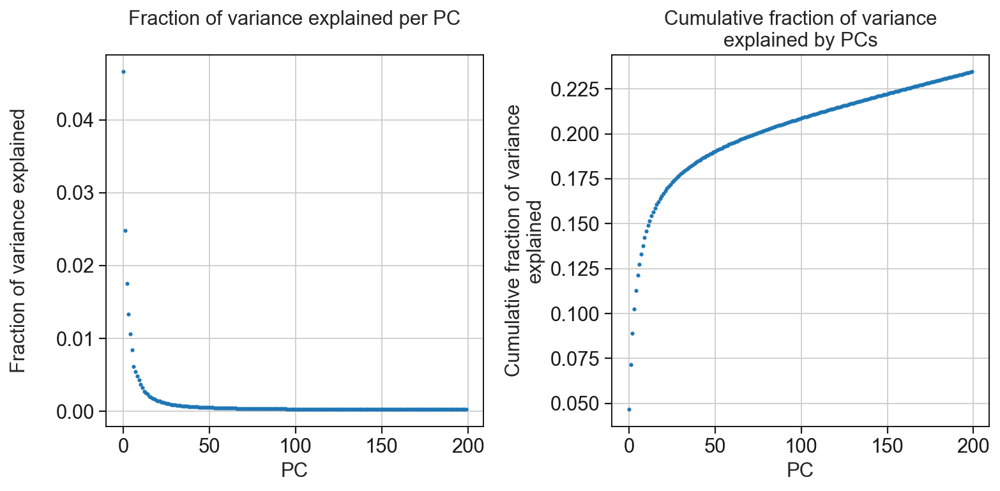

In [47]:
observe_variance(adata)

In [48]:
rng = np.random.RandomState(42)
sc.tl.pca(adata, n_comps=65, svd_solver='arpack', random_state=rng, use_highly_variable=False)

In [49]:
sc.pp.neighbors(adata, n_neighbors=15)

In [50]:
sc.tl.umap(adata)

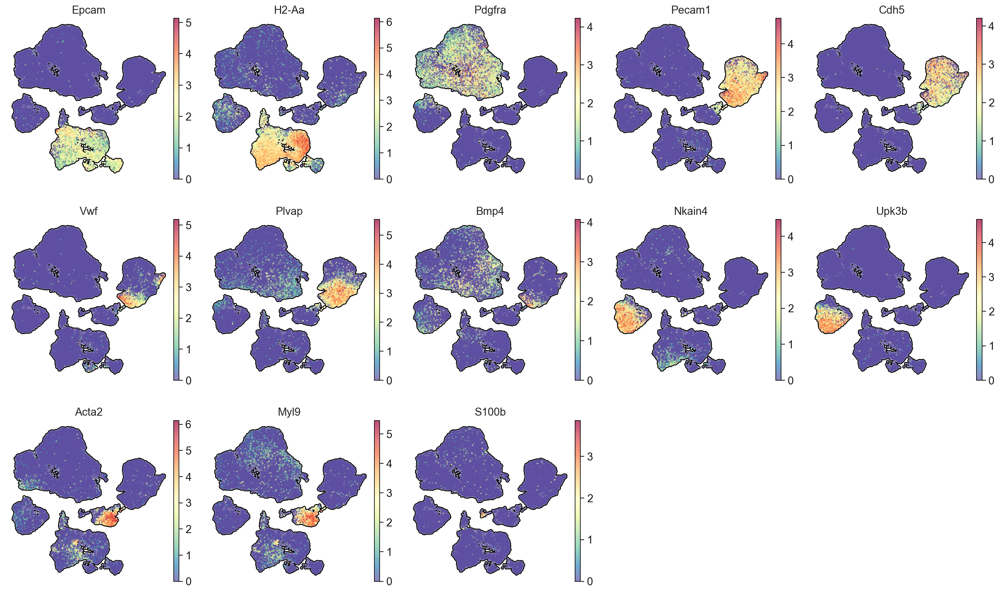

In [51]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)
sc.pl.umap(
    adata, 
    color=['Epcam', 'H2-Aa', 'Pdgfra', 'Pecam1',  'Cdh5', 'Vwf', 'Plvap', 'Bmp4', 'Nkain4', 'Upk3b', 'Acta2', 'Myl9', 'S100b'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

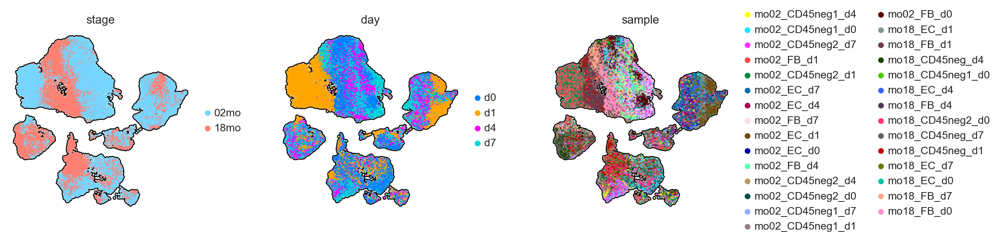

In [52]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)
sc.pl.umap(
    adata, 
    color=['stage', 'day', 'sample'],   
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

## Data for Fig 1

In [53]:
adata_d0 = adata[(adata.obs['day']=='d0')]

In [54]:
# Remove columns with all 0s
sc.pp.filter_genes(adata_d0, min_cells=1)

In [55]:
sc.pp.highly_variable_genes(adata_d0, n_top_genes=3500, n_bins=20, flavor='seurat',  inplace=True)

In [56]:
rng = np.random.RandomState(42)
sc.tl.pca(adata_d0, n_comps=200, svd_solver='arpack', random_state=rng, use_highly_variable=True)

<function matplotlib.pyplot.show(close=None, block=None)>

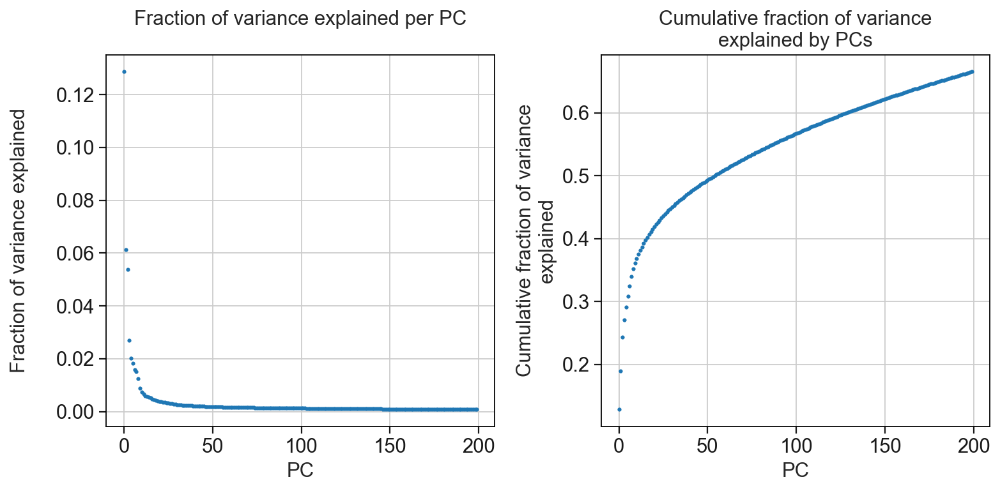

In [57]:
observe_variance(adata_d0)

In [58]:
rng = np.random.RandomState(42)
sc.tl.pca(adata_d0, n_comps=45, svd_solver='arpack', random_state=rng, use_highly_variable=True)

In [59]:
sce.pp.harmony_integrate(adata_d0, 'sample')

2024-04-12 18:36:20,204 - harmonypy - INFO - Iteration 1 of 10
2024-04-12 18:36:23,616 - harmonypy - INFO - Iteration 2 of 10
2024-04-12 18:36:26,728 - harmonypy - INFO - Iteration 3 of 10
2024-04-12 18:36:29,819 - harmonypy - INFO - Converged after 3 iterations


In [60]:
sc.pp.neighbors(adata_d0, n_neighbors=15, use_rep='X_pca_harmony')
sc.tl.umap(adata_d0)

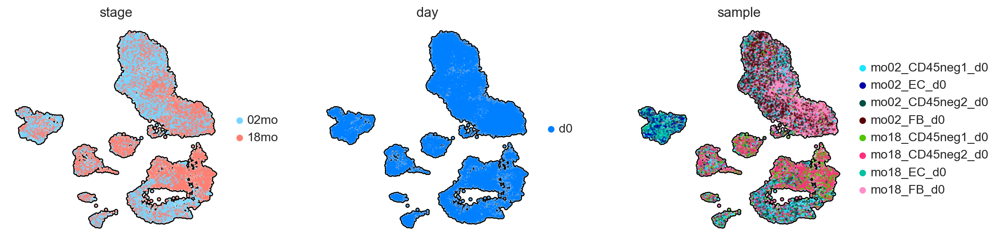

In [61]:
sc.pl.umap(adata_d0, color=['stage', 'day', 'sample'], 
                        color_map='Spectral_r',  use_raw=False, ncols=4, wspace = 0.3,
                        outline_width=[0.6, 0.05], size=15,  frameon=False, add_outline=True, sort_order = False)

In [62]:
for resolution_parameter in [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]:
    sc.tl.leiden(adata_d0, resolution=resolution_parameter, random_state=42, 
                        key_added='leiden_'+str(resolution_parameter))

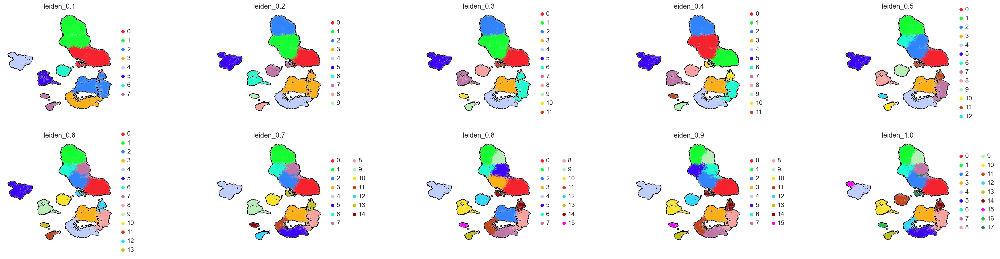

In [63]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)
sc.pl.umap(
    adata_d0, 
    color=['leiden_0.1', 'leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'leiden_0.5', 
           'leiden_0.6', 'leiden_0.7', 'leiden_0.8','leiden_0.9', 'leiden_1.0'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.7,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

### Create group annotation

In [64]:
adata_d0.obs['cell_type'] = ['FB' if (x=='0' or x=='1' or x=='2') else 
                             'EC' if (x=='5') else
                             'TEC' if (x=='3' or x=='4' or x=='6' or x=='9' or x=='10') else 
                             '6:MEC' if x=='8' else
                             '7:vSMC/PC' if x=='7' else
                             '8:nmSC' if (x=='11') else 'ERROR' for x in adata_d0.obs['leiden_0.3']] 

In [65]:
adata_d0.uns['cell_type_colors'] = ['#d62728','#19c9b3', '#FFA5D2', '#ff7f0e','#199919', '#aa40fc']

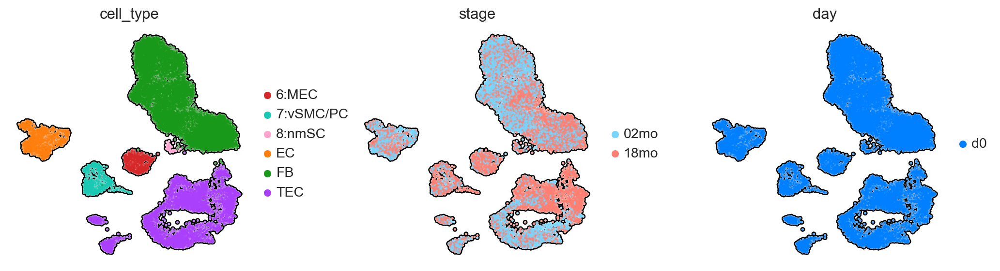

In [66]:
sc.pl.umap(adata_d0, color=['cell_type', 'stage', 'day'], 
                        color_map='Spectral_r',  use_raw=False, ncols=4, wspace = 0.3,
                        outline_width=[0.6, 0.05], size=15,  frameon=False, add_outline=True, sort_order = False)

In [ ]:
path_to_h5ad = '../output/anndata_io/FigED2a.h5ad'

In [ ]:
adata_d0.write(path_to_h5ad)

In [ ]:
adata_d0 = sc.read_h5ad(path_to_h5ad)
adata_d0.uns['log1p']["base"] = None

## Data for Fig S13

In [67]:
adata_d147 = adata[(adata.obs['day']!='d0')]

In [68]:
# Remove columns with all 0s
sc.pp.filter_genes(adata_d147, min_cells=1)

In [69]:
adata_d47 = adata_d147[adata_d147.obs['day']!='d1']

In [70]:
# Remove genes that are not expressed in any cells (remove columns with all 0s)
sc.pp.filter_genes(adata_d47, min_cells=1)

In [71]:
sc.pp.highly_variable_genes(adata_d47, n_top_genes=3500, flavor='seurat')

In [72]:
hvgs = adata_d47.var[adata_d47.var['highly_variable']==True].index

In [73]:
adata_d147.var['highly_variable'] = ''

In [74]:
adata_d147.var['highly_variable'] = [True if x in hvgs else False for x in adata_d147.var['highly_variable'].index]

In [75]:
rng = np.random.RandomState(42)
sc.tl.pca(adata_d147, n_comps=200, svd_solver='arpack', random_state=rng, use_highly_variable=True)

<function matplotlib.pyplot.show(close=None, block=None)>

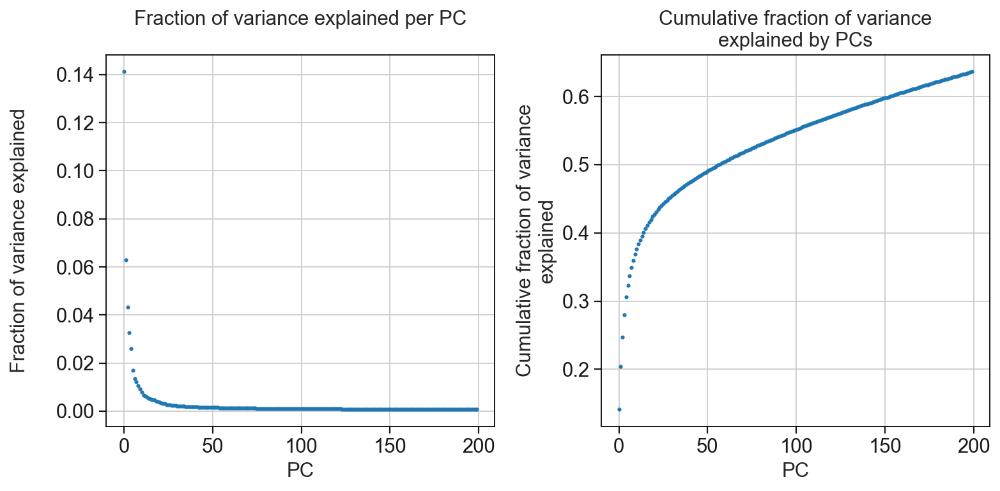

In [76]:
observe_variance(adata_d147)

In [77]:
sc.tl.pca(adata_d147, n_comps=65, svd_solver='arpack', random_state=rng, use_highly_variable=True) 

In [78]:
sce.pp.harmony_integrate(adata_d147, 'sample')

2024-04-12 18:42:41,799 - harmonypy - INFO - Iteration 1 of 10
2024-04-12 18:42:54,623 - harmonypy - INFO - Iteration 2 of 10
2024-04-12 18:43:07,648 - harmonypy - INFO - Iteration 3 of 10
2024-04-12 18:43:20,401 - harmonypy - INFO - Iteration 4 of 10
2024-04-12 18:43:33,083 - harmonypy - INFO - Iteration 5 of 10
2024-04-12 18:43:46,131 - harmonypy - INFO - Converged after 5 iterations


In [79]:
sc.pp.neighbors(adata_d147, n_neighbors=15, use_rep='X_pca_harmony')
sc.tl.umap(adata_d147)

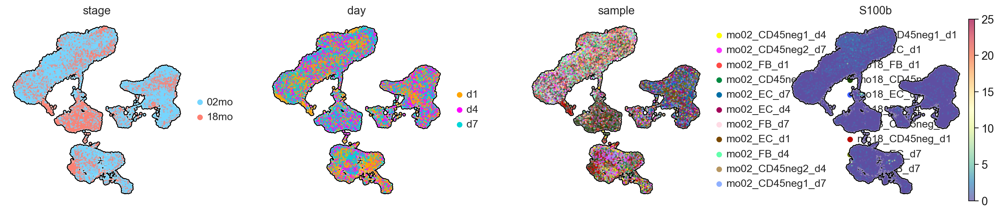

In [80]:
#65
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    adata_d147, 
    color=['stage', 'day', 'sample', 'S100b'], 
    ncols=6,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    cmap='Spectral_r',
    wspace = 0.3,
    add_outline=True
)

In [81]:
for resolution_parameter in [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 1.1, 1.2, 1.3, 1.4, 1.5]:
    sc.tl.leiden(adata_d147, resolution=resolution_parameter, random_state=42, 
                        key_added='leiden_'+str(resolution_parameter))

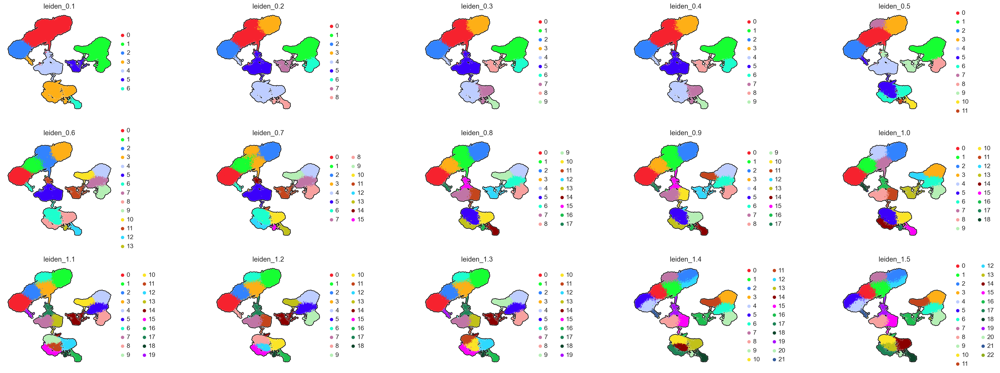

In [82]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)
sc.pl.umap(
    adata_d147, 
    color=['leiden_0.1', 'leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'leiden_0.5', 
           'leiden_0.6', 'leiden_0.7', 'leiden_0.8','leiden_0.9', 'leiden_1.0',
           'leiden_1.1', 'leiden_1.2', 'leiden_1.3','leiden_1.4', 'leiden_1.5'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.7,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

### Create group annotation

In [83]:
adata_d147.obs['cell_type'] = ['FB' if (x=='0' or x=='1' or x=='2' or x=='3') else 
                               'EC' if (x=='4' or x=='7' or x=='8' or x=='9') else
                               'TEC' if (x=='6' or x=='10' or x=='12' or x=='13' or x=='15') else 
                               '6:MEC' if x=='5' else
                               '7:vSMC/PC' if x=='11' else 
                               '8:nmSC' if x=='14' else 'ERROR' for x in adata_d147.obs['leiden_0.7']] 

In [84]:
adata_d147.uns['cell_type_colors'] = ['#d62728','#19c9b3', '#FFA5D2', '#ff7f0e','#199919', '#aa40fc']

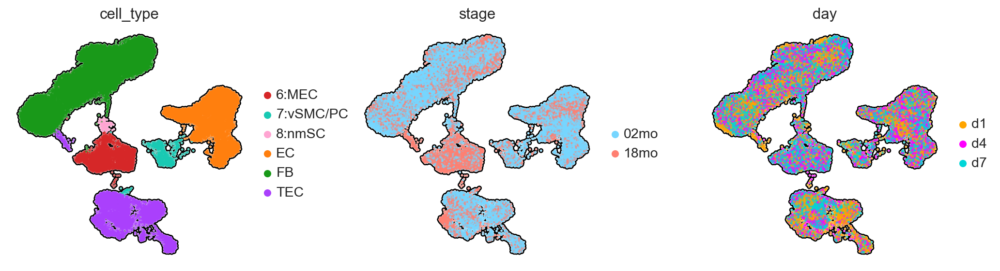

In [85]:
sc.pl.umap(adata_d147, color=['cell_type', 'stage', 'day'], 
                        color_map='Spectral_r',  use_raw=False, ncols=4, wspace = 0.3,
                        outline_width=[0.6, 0.05], size=15,  frameon=False, add_outline=True, sort_order = False)

In [ ]:
path_to_h5ad = '../output/anndata_io/FigED10a.h5ad'

In [ ]:
adata_d147.write(path_to_h5ad)

## Data for Fig 5

In [86]:
adata_d0147 = adata

In [87]:
# Remove columns with all 0s
sc.pp.filter_genes(adata_d0147, min_cells=1)

In [88]:
adata_d047 = adata_d0147[adata_d0147.obs['day']!='d1']

In [89]:
# Remove genes that are not expressed in any cells (remove columns with all 0s)
sc.pp.filter_genes(adata_d047, min_cells=1)

In [90]:
sc.pp.highly_variable_genes(adata_d047, n_top_genes=3500, flavor='seurat')

In [91]:
hvgs = adata_d047.var[adata_d047.var['highly_variable']==True].index

In [92]:
adata_d0147.var['highly_variable'] = ''

In [93]:
adata_d0147.var['highly_variable'] = [True if x in hvgs else False for x in adata_d0147.var['highly_variable'].index]

In [94]:
rng = np.random.RandomState(42)
sc.tl.pca(adata_d0147, n_comps=200, svd_solver='arpack', random_state=rng, use_highly_variable=True)

<function matplotlib.pyplot.show(close=None, block=None)>

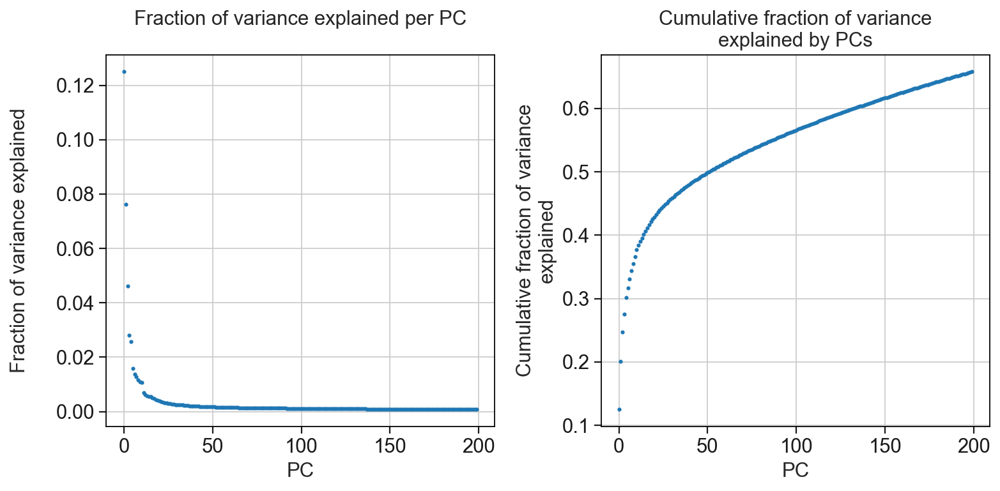

In [95]:
observe_variance(adata_d0147)

In [96]:
sc.tl.pca(adata_d0147, n_comps=65, svd_solver='arpack', random_state=rng, use_highly_variable=True) 

In [97]:
sce.pp.harmony_integrate(adata_d0147, 'sample')

2024-04-16 09:55:18,940 - harmonypy - INFO - Iteration 1 of 10
2024-04-16 09:55:39,356 - harmonypy - INFO - Iteration 2 of 10
2024-04-16 09:55:59,839 - harmonypy - INFO - Iteration 3 of 10
2024-04-16 09:56:21,056 - harmonypy - INFO - Iteration 4 of 10
2024-04-16 09:56:41,989 - harmonypy - INFO - Iteration 5 of 10
2024-04-16 09:57:03,039 - harmonypy - INFO - Converged after 5 iterations


In [98]:
sc.pp.neighbors(adata_d0147, n_neighbors=15, use_rep='X_pca_harmony')
sc.tl.umap(adata_d0147)

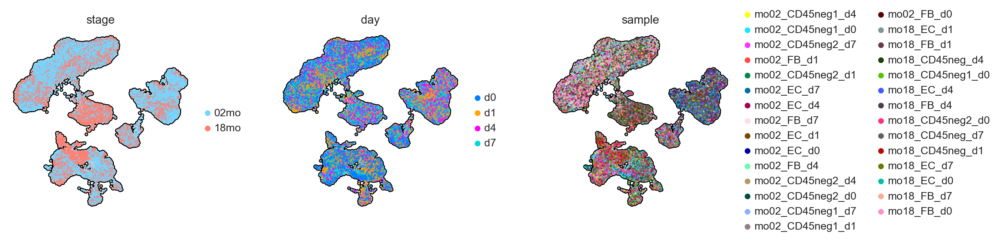

In [99]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    adata_d0147, 
    color=['stage', 'day', 'sample'], 
    ncols=6,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    cmap='Spectral_r',
    wspace = 0.3,
    add_outline=True
)

In [ ]:
path_to_h5ad = '../output/anndata_io/Fig5gh.h5ad'

In [ ]:
adata_d0147.write(path_to_h5ad)